In [171]:
from pigeon import annotate
from IPython.display import display, Image
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import pickle as pkl

In [13]:
names=[]
for f in os.listdir('assets'):
    names.append('assets/'+f)

In [14]:
print(len(names))
names

225


['assets/1545197235898.jpg',
 'assets/2015-10-07 20.13.46.png',
 'assets/20150316_181926.jpg',
 'assets/20150316_181955.jpg',
 'assets/20150316_182811.jpg',
 'assets/20150316_182817.jpg',
 'assets/20150316_185448.jpg',
 'assets/20150406_134241.jpg',
 'assets/20150417_012255.jpg',
 'assets/20150417_012303.jpg',
 'assets/20150508_124042.jpg',
 'assets/20150508_124045.jpg',
 'assets/20150508_124052.jpg',
 'assets/20150508_124126.jpg',
 'assets/20150510_160757.jpg',
 'assets/20150510_160833.jpg',
 'assets/20150510_170145.jpg',
 'assets/20150510_170148.jpg',
 'assets/20150510_170219.jpg',
 'assets/20150510_170223.jpg',
 'assets/20150510_170254.jpg',
 'assets/20150510_170258.jpg',
 'assets/20150510_170402.jpg',
 'assets/20150510_170412.jpg',
 'assets/20150510_170425.jpg',
 'assets/20150510_170438.jpg',
 'assets/20150510_170442.jpg',
 'assets/20150511_081455.jpg',
 'assets/20150511_081501.jpg',
 'assets/20150511_171939.jpg',
 'assets/20150511_171954.jpg',
 'assets/20150511_172002.jpg',
 'asse

In [15]:
annotations = annotate(
  names,
  options=['shantanu', 'prutha'],
  display_fn=lambda filename: display(Image(filename))
)

HTML(value='0 examples annotated, 226 examples left')

Output()

Annotation done.


In [16]:
len(annotations)

225

In [17]:
f=open("dataset.txt","w")

for d in annotations:
    f.write(str(d)+"\n")

f.close()

In [18]:
x_train=[]
y_train=[]
f=open('dataset.txt','r')
count=0
for l in f:
    #t=tuple(l)
    
    img = cv2.imread(l[1:len(l)-2].split(',')[0].split('\'')[1])
    res = cv2.resize(img, dsize=(64, 64), interpolation=cv2.INTER_CUBIC)
    x_train.append(res)
    
    if l[1:len(l)-2].split(',')[1].split('\'')[1] == 'shantanu':
        y_train.append(1)
    else:
        y_train.append(0)
    
    print(l[1:len(l)-2].split(',')[0].split('\'')[1])

assets/1545197235898.jpg
assets/2015-10-07 20.13.46.png
assets/20150316_181926.jpg
assets/20150316_181955.jpg
assets/20150316_182811.jpg
assets/20150316_182817.jpg
assets/20150316_185448.jpg
assets/20150406_134241.jpg
assets/20150417_012255.jpg
assets/20150417_012303.jpg
assets/20150508_124042.jpg
assets/20150508_124045.jpg
assets/20150508_124052.jpg
assets/20150508_124126.jpg
assets/20150510_160757.jpg
assets/20150510_160833.jpg
assets/20150510_170145.jpg
assets/20150510_170148.jpg
assets/20150510_170219.jpg
assets/20150510_170223.jpg
assets/20150510_170254.jpg
assets/20150510_170258.jpg
assets/20150510_170402.jpg
assets/20150510_170412.jpg
assets/20150510_170425.jpg
assets/20150510_170438.jpg
assets/20150510_170442.jpg
assets/20150511_081455.jpg
assets/20150511_081501.jpg
assets/20150511_171939.jpg
assets/20150511_171954.jpg
assets/20150511_172002.jpg
assets/20150511_172042.jpg
assets/20150511_172055.jpg
assets/20150511_172056.jpg
assets/20150516_193332.jpg
assets/20150516_193334.jpg

In [34]:
x_test=x_train
y_test=y_train

x_train=np.stack(x_train)
y_train=np.stack(y_train)

x_test=np.stack(x_test)
y_test=np.stack(y_test)

y_train=y_train.reshape(1,225)
y_test=y_test.reshape(1,225)
#np.reshape(y_test,(225,1))
#print(np.shape(y_test))

In [38]:
x_train_flatten = x_train.reshape(x_train.shape[0],-1).T
x_test_flatten = x_test.reshape(x_test.shape[0],-1).T

x_train = x_train_flatten/255
x_test = x_test_flatten/255

#np.shape(x_train)

In [51]:
x_train.shape

(12288, 225)

In [55]:
w = np.zeros((x_train.shape[0],1))
b = 0
w.shape

(12288, 1)

In [77]:
m = x_train.shape[1]

In [46]:
def sigmoid(z):
    s=1/(1+np.exp(-z))
    return s

In [47]:
sigmoid(np.array([0,2]))

array([0.5       , 0.88079708])

In [69]:
def forward(w,b,x_train,y_train):
    
    z=np.dot(w.T,x_train) + b
    a = sigmoid(z)
    m = x_train.shape[1]
    
    cost = -np.sum( y_train*np.log(a) + (1-y_train)*np.log(1-a) )/m
    
    dw = np.dot(x_train,(a-y_train).T)/m
    db = np.sum(a-y_train)/m
    
    return cost,dw,db

In [72]:
rate=0.005
iteration=2

In [118]:
def backward(w,b,x_train,y_train,lr,iterations):
    for i in range(iterations):
        cost,dw,db = forward(w,b,x_train,y_train)
        w=w - rate*dw
        b=b - rate*db
        print(cost)
    return w,b,cost

In [99]:
def predict(w,b,x):
    z = np.dot(w.T,x) + b
    a = sigmoid(z)
    y = np.zeros((1,m))
    print(a.shape)
    for i in range(a.shape[1]):
        if a[0,i] <= 0.5:
            y[0,i] = 0
        else:
            y[0,i]=1
    return y

In [127]:
w,b,cost = backward(w,b,x_train,y_train,0.005,250)
y=predict(w,b,x_test)
accuracy = 100-((np.sum(np.abs(y-y_test))/m)*100)
print(accuracy)
cost
#y.shape

0.1377607361154076
0.13766520805028665
0.13756980602357016
0.13747452979262456
0.1373793791154291
0.13728435375057374
0.13718945345725805
0.13709467799528788
0.1370000271250753
0.13690550060763457
0.136811098204583
0.1367168196781357
0.1366226647911067
0.1365286333069054
0.13643472498953504
0.13634093960359106
0.1362472769142595
0.13615373668731473
0.13606031868911697
0.13596702268661207
0.13587384844732867
0.13578079573937582
0.13568786433144314
0.13559505399279656
0.1355023644932786
0.13540979560330507
0.1353173470938646
0.13522501873651566
0.13513281030338564
0.13504072156716893
0.1349487523011242
0.13485690227907468
0.13476517127540455
0.1346735590650582
0.13458206542353768
0.13449069012690182
0.1343994329517644
0.13430829367529193
0.1342172720752023
0.13412636792976304
0.1340355810177896
0.13394491111864423
0.13385435801223286
0.13376392147900465
0.13367360129995046
0.1335833972566
0.13349330913102192
0.1334033367058202
0.13331347976413396
0.13322373808963545
0.13313411146652804
0

0.11733204222435258

In [121]:
accuracy = 100-((np.sum(np.abs(y-y_test))/m)*100)
print(accuracy)

98.22222222222223


In [128]:
print(accuracy)

100.0


Shantanu


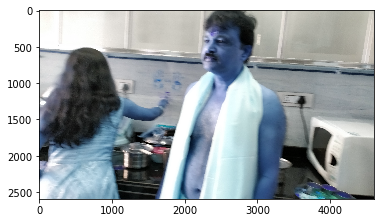

In [166]:
img = cv2.imread('test/test14.jpg')
res = cv2.resize(img, dsize=(64, 64), interpolation=cv2.INTER_CUBIC)
res = res.reshape(64*64*3,1)
res = res/255

plt.imshow(img)

z = np.dot(w.T,res) + b
a= sigmoid(z)
if a[0,0] <= .5:
    print("Shantanu")
else:
    print("Prutha")

In [143]:
w

array([[-0.00059124],
       [ 0.0005164 ],
       [ 0.00731645],
       ...,
       [ 0.01133949],
       [-0.00802247],
       [ 0.01668223]])

In [144]:
b

-0.10867181689700126

In [169]:
f=open('weights.txt','w')
f.write(str(w))
f.write("\n")
f.write(str(b))
f.close()

In [174]:
data  = {"w":w,
         "b":b}

with open('weights.pkl','wb') as f:
    pkl.dump(data,f)